# Figure 1: Temporal dynamics of SPT5 binding reflects transcriptional changes throughout embryogenesis

- [Figure 1 B: Correlation of SPT5 binding between replicates](#1_correlation_replicates)
- [Figure 1 C: Dynamics of SPT5 binding and gene expression across embryogenesis](#2_SPT5_RNA_dynamics_embryogenesis)
- [Figure 1 D: metaprofiles of genes from clusters from figure 1 C](#3_metaprofiles_3_clusters)
- [Figure 1E: PyGenomeTracks: SPT5 binding and RNAseq for example gene of each cluster](#4_pygenometracks)

In [2]:
plot_dir = "/g/furlong/project/92_SPT4_SPT5/Manuscript/Figures/Figure_1/"

### Figure 1 B: Correlation of SPT5 binding between replicates <a class="anchor" id="1_correlation_replicates"></a>
Dendogram and pearson correlation heatmaps of CUT&Tag SPT5 replicates

/tmp/ipykernel_646/2880072779.py:16: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



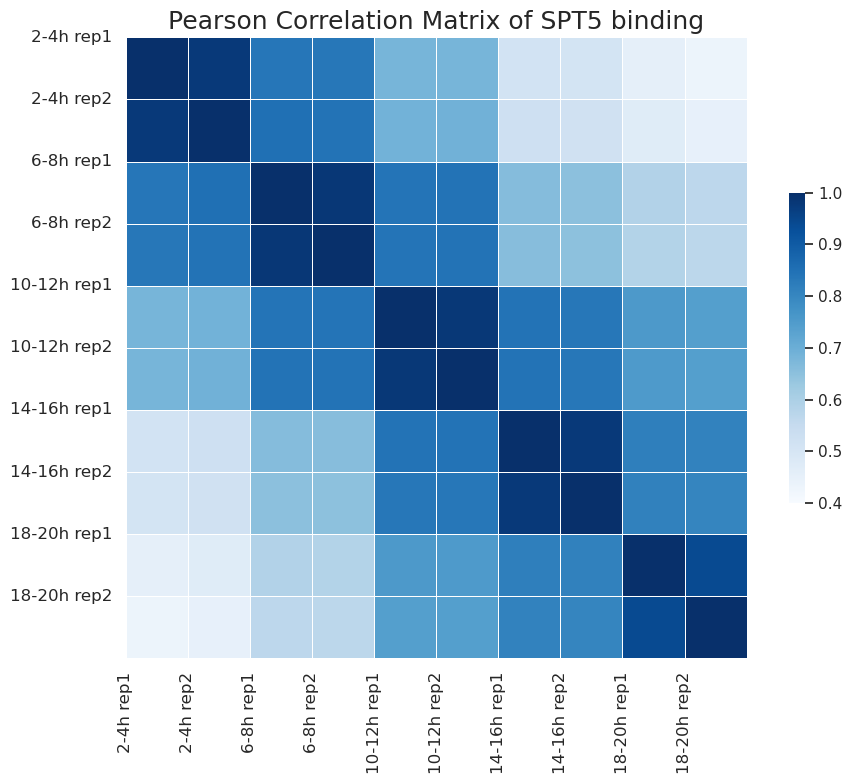

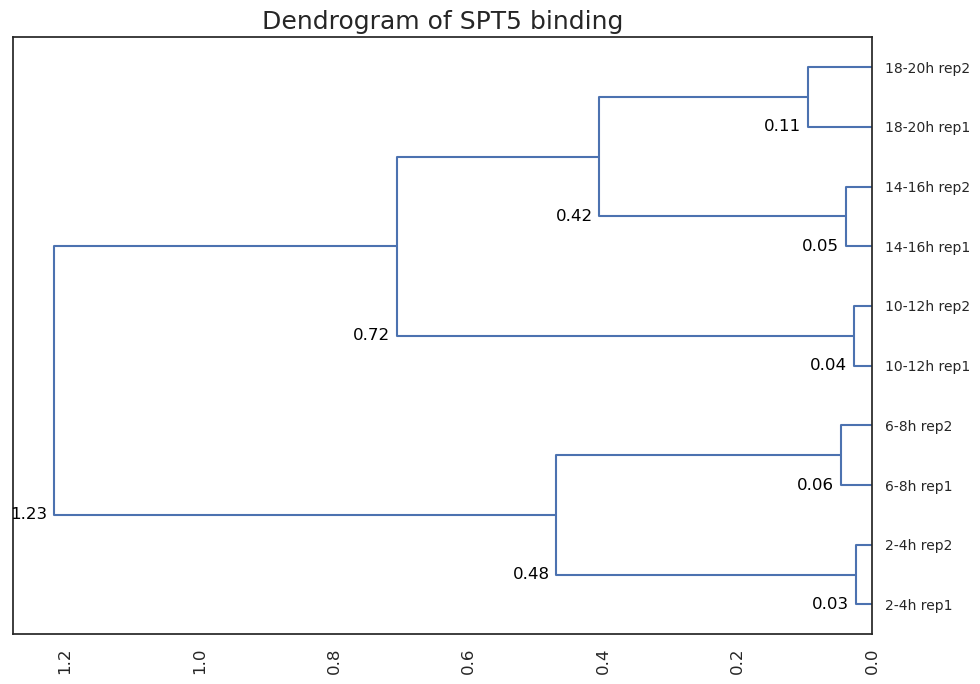

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage, leaves_list
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import cm


# Function to create and save heatmap
def create_heatmap(data, labels, title, filename, vmin=0.4, vmax=1, labeling=False):
    plt.figure(figsize=(10, 8))
    sns.set(style='white')
    
    # get same blue colorscale as Fig 1C
    blues_cmap = cm.get_cmap('Blues') 
    custom_blues_cmap = LinearSegmentedColormap.from_list(
        "custom_blues", blues_cmap(np.linspace(0, 1, 256)), N=256
    )

    sns.heatmap(data, cmap=custom_blues_cmap, annot=labeling, fmt=".2f",
                square=True, linewidths=.5, cbar_kws={"shrink": .5},
                vmin=vmin, vmax=vmax)

    plt.title(title, fontsize=18)
    plt.xticks(ticks=range(len(labels)), labels=labels, fontsize=12, rotation=90) 
    plt.yticks(ticks=range(len(labels)), labels=labels, fontsize=12, rotation=0) 
    plt.tight_layout()

    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

# Function to create and save dendrogram maintaining column order
def create_dendrogram(corr_matrix, labels, title, filename):
    # Calculate linkage matrix
    linkage_matrix = linkage(corr_matrix, method='complete', optimal_ordering=False)
    
    # Get order of leaves and order them
    leaf_order = leaves_list(linkage_matrix)
    sorted_labels = [labels[i] for i in leaf_order]
    
    # create dendogram
    plt.figure(figsize=(10, 7))
    dendro = dendrogram(linkage_matrix, labels=sorted_labels, orientation='left', 
                        leaf_font_size=10, color_threshold=0)  

    # Show distances at each node
    for i, d in zip(dendro['icoord'], dendro['dcoord']):
        x = d[1]+0.01  
        y = i[1] 
        plt.text(x, y, f'{x:.2f}', color='black', ha='right', va='center')  

    plt.title(title, fontsize=18) 
    plt.xticks(fontsize=12, rotation=90) 
    plt.tight_layout()

    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

# Function to process and filter expression data
def process_expression_data(df, selected_columns):
    expression_data = df[selected_columns]
    expression_data = expression_data.loc[~(expression_data == 0).any(axis=1)]  # Remove rows with 0 values
    expression_data.set_index("gene_ID", inplace=True)
    return expression_data.corr(method='pearson')


#-----------------------------REPLICATES-----------------------------------------------
# Heatmap and dendrogram for replicates
replicate_labels = ["2-4h rep1", "2-4h rep2", 
                    "6-8h rep1", "6-8h rep2",
                    "10-12h rep1", "10-12h rep2", 
                    "14-16h rep1", "14-16h rep2",
                    "18-20h rep1", "18-20h rep2"]

# Load dataframe from .csv file
replicates_df = pd.read_csv("/g/furlong/project/92_SPT4_SPT5/CUTnTag/data/tables/SPT5_binding_replicates.csv")

replicate_columns = ["gene_ID", 
                    "2_4h_rep1_mean_rpkm", "2_4h_rep2_mean_rpkm", 
                    "6_8h_rep1_mean_rpkm", "6_8h_rep2_mean_rpkm",
                    "10_12h_rep1_mean_rpkm","10_12h_rep2_mean_rpkm", 
                    "14_16h_rep1_mean_rpkm", "14_16h_rep2_mean_rpkm",
                    "18_20h_rep1_mean_rpkm", "18_20h_rep2_mean_rpkm"]
dendogramm_replicates_order  = ["2_4h_rep1_mean_rpkm", "2_4h_rep2_mean_rpkm", 
                    "6_8h_rep1_mean_rpkm", "6_8h_rep2_mean_rpkm",
                    "10_12h_rep1_mean_rpkm","10_12h_rep2_mean_rpkm", 
                    "14_16h_rep1_mean_rpkm", "14_16h_rep2_mean_rpkm",
                    "18_20h_rep1_mean_rpkm", "18_20h_rep2_mean_rpkm"]


# mean SPT5 binding across gene
corr_matrix_replicates = process_expression_data(replicates_df, replicate_columns)
# Ensure the order of columns in the correlation matrix matches the desired order
corr_matrix_replicates = corr_matrix_replicates.loc[dendogramm_replicates_order, dendogramm_replicates_order].values

create_heatmap(corr_matrix_replicates, replicate_labels, 'Pearson Correlation Matrix of SPT5 binding', 
                plot_dir + 'Figure_1_B_heatmap.pdf', labeling=False)

create_dendrogram(corr_matrix_replicates, replicate_labels,  'Dendrogram of SPT5 binding', 
                   plot_dir + 'Figure_1_B_dendogramm.pdf')



### Figure 1 C: Dynamics of SPT5 binding and gene expression across embryogenesis <a class="anchor" id="2_SPT5_RNA_dynamics_embryogenesis"></a>
FPKM and RPKM values are normalized usind z-score normalization.
Data is clustered usind k-means clustering with 3 clusters.

In [4]:
import pandas as pd
import os
import plotly.graph_objects as go
from sklearn.cluster import KMeans
import numpy as np
from scipy.stats import zscore
from plotly.subplots import make_subplots

# Load SPT5 data
input_file = "/g/furlong/project/92_SPT4_SPT5/CUTnTag/data/tables/SPT5_binding_merged.csv"
SPT5_all_df = pd.read_csv(input_file)
mean_RPKM_columns = [
    "gene_ID", 
    "2_4h_mean_rpkm", 
    "6_8h_mean_rpkm", 
    "10_12h_mean_rpkm", 
    "14_16h_mean_rpkm", 
    "18_20h_mean_rpkm"
]
SPT5_df = SPT5_all_df[mean_RPKM_columns]

# Load RNAseq data and rename columns
file_path = "/g/furlong/project/85_seqFISH/data/gene_expression/gene_expression_across_embryogenesis_FPKM.txt"
RNAseq_all_df = pd.read_csv(file_path, sep='\t')
RNAseq_columns = [
    "gene_ID", 
    "2-4h", 
    "6-8h", 
    "10-12h", 
    "14-16h", 
    "18-20h"
]
RNAseq_df = RNAseq_all_df[RNAseq_columns]
RNAseq_df.columns = [
    "gene_ID", 
    "2_4h_FPKM", 
    "6_8h_FPKM", 
    "10_12h_FPKM", 
    "14_16h_FPKM", 
    "18_20h_FPKM"
]

# Merge both DataFrames based on 'gene_ID'
SPT5_RNAseq_df = pd.merge(SPT5_df, RNAseq_df, on='gene_ID')

# Drop rows with missing values
SPT5_RNAseq_df_valid = SPT5_RNAseq_df.dropna().copy()

# Normalize RPKM and FPKM columns using z-score
SPT5_RNAseq_df_valid.iloc[:, 1:6] = SPT5_RNAseq_df_valid.iloc[:, 1:6].apply(zscore, axis=1).copy()  # Normalize RPKM columns
SPT5_RNAseq_df_valid.iloc[:, 6:11] = SPT5_RNAseq_df_valid.iloc[:, 6:11].apply(zscore, axis=1).copy()  # Normalize FPKM columns

SPT5_RNAseq_df_valid = SPT5_RNAseq_df_valid.dropna(subset=SPT5_RNAseq_df_valid.columns[1:11])

# KMeans clustering with 3 clusters
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
SPT5_RNAseq_df_valid['cluster'] = kmeans.fit_predict(SPT5_RNAseq_df_valid.iloc[:, 1:11]).copy()  # Use RPKM and FPKM columns for clustering

# Change order so first cluster is decreasing, second is transient and third cluster is increasing
custom_order = {0: 2, 1: 0, 2: 1}  
SPT5_RNAseq_df_valid['cluster'] = SPT5_RNAseq_df_valid['cluster'].map(custom_order)
sorted_SPT5_RNAseq_df_valid = SPT5_RNAseq_df_valid.sort_values(by=['cluster'])
print(f"using {len(sorted_SPT5_RNAseq_df_valid)} genes for plotting")
# Create a subplot figure with reduced vertical spacing
fig = make_subplots(rows=n_clusters, cols=1, shared_xaxes=True, vertical_spacing=0.005)  # Adjust vertical_spacing as needed

# Loop through each cluster and create a heatmap for RPKM and FPKM
for cluster_num in range(n_clusters):

    cluster_data = sorted_SPT5_RNAseq_df_valid[sorted_SPT5_RNAseq_df_valid['cluster'] == cluster_num]

    # Heatmap for SPT5 RPKM values
    fig.add_trace(go.Heatmap(
        z=cluster_data.iloc[:, 1:6], 
        x=cluster_data.columns[1:6],  
        y=cluster_data['gene_ID'],  
        colorscale='Blues', 
        zmin=-2,  
        zmax=2,  
        showscale=True,
        name='RPKM',
        colorbar=dict(title='RPKM', len=0.5, x=1.02, y=0.8),
    ), row=cluster_num + 1, col=1)

    # Heatmap for RNAseq FPKM values
    fig.add_trace(go.Heatmap(
        z=cluster_data.iloc[:, 6:11],  
        x=cluster_data.columns[6:11],  
        y=cluster_data['gene_ID'],  
        colorscale='Greens', 
        zmin=-2,  
        zmax=2,  
        showscale=True,
        name='FPKM',
        colorbar=dict(title='FPKM', len=0.5, x=1.1, y=0.8),
    ), row=cluster_num + 1, col=1)

    fig.update_yaxes(showticklabels=False, row=cluster_num + 1, col=1)


# Update layout
fig.update_layout(
    title=f'Heatmaps for {n_clusters} K-Means Clusters',
    height=1200,
    width=1200,
    showlegend=False,
    yaxis_showticklabels=False  # Hide gene names
)

# Save the heatmap 
fig_path = plot_dir + f"Figure_1_C_heatmap.pdf"
fig.show()
fig.write_image(fig_path)

# Merge the clustering result with bed_df to get full gene information
merged_cluster_df = pd.merge(SPT5_all_df, sorted_SPT5_RNAseq_df_valid[['gene_ID', 'cluster']], on='gene_ID')

# Save each cluster's gene information in separate files
for cluster_num in range(n_clusters):
    cluster_genes = merged_cluster_df[merged_cluster_df['cluster'] == cluster_num]
    output_file_path = plot_dir + f"Figure_1_C_cluster_{cluster_num + 1}_genes.bed"
    cluster_genes['score'] = '.'
    cluster_genes[['chrom', 'start', 'end', 'gene_ID', 'score', 'strand']].to_csv(output_file_path, sep='\t', index=False, header=False)



using 13168 genes for plotting


/tmp/ipykernel_646/2624402922.py:123: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_646/2624402922.py:123: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_646/2624402922.py:123: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Figure 1 D: metaprofiles of genes from clusters from figure 1 C <a class="anchor" id="3_metaprofiles_3_clusters"></a>

Generate deeptools matrix
```bash
computeMatrix reference-point --referencePoint TSS -b 1000 -a 5000 \
        -S /g/furlong/project/92_SPT4_SPT5/CUTnTag/data/bw/RPKM_merged/CUTnTag_SPT5_TimeCourse_2-4h_merged_RPKM_normalized.bw \
           /g/furlong/project//92_SPT4_SPT5/CUTnTag/data/bw/RPKM_merged/CUTnTag_SPT5_TimeCourse_6-8h_merged_RPKM_normalized.bw \
           /g/furlong/project/92_SPT4_SPT5/CUTnTag/data/bw/RPKM_merged/CUTnTag_SPT5_TimeCourse_10-12h_merged_RPKM_normalized.bw \
           /g/furlong/project/92_SPT4_SPT5/CUTnTag/data/bw/RPKM_merged/CUTnTag_SPT5_TimeCourse_14-16h_merged_RPKM_normalized.bw \
           /g/furlong/project/92_SPT4_SPT5/CUTnTag/data/bw/RPKM_merged/CUTnTag_SPT5_TimeCourse_18-20h_merged_RPKM_normalized.bw \
        -R /g/furlong/project/92_SPT4_SPT5/Manuscript/Figures/Figure_1/Figure_1_D_cluster_1_genes.bed \
           /g/furlong/project/92_SPT4_SPT5/Manuscript/Figures/Figure_1/Figure_1_D_cluster_2_genes.bed \
           /g/furlong/project/92_SPT4_SPT5/Manuscript/Figures/Figure_1/Figure_1_D_cluster_3_genes.bed \
          --skipZeros --missingDataAsZero \
          -o /g/furlong/project/92_SPT4_SPT5/Manuscript/Figures/Figure_1/Figure_1_D_clusters_genes.gz 
```

 Set bins after TES to NaN for metaprofile plotting

In [8]:
import pandas as pd
import numpy as np
import gzip
from tqdm import tqdm  # For progress tracking

#############################################################
### Script for taking TSS centered deeptools heatmaps 
###     set bins to NaN after TES 
#############################################################


def process_matrix(input_file, output_file):
    """
    Process matrix by setting all values beyond the TES to NaN for all clusters.

    Args:
        input_file (str): Path to the input .gz matrix file.
        output_file (str): Path to save the modified .gz matrix file.
    """
    # Open the .gz file and load the matrix
    with gzip.open(input_file, 'rt') as f:
        # Read the first line (header)
        header = f.readline().strip()
        
        # Load the remaining data into a DataFrame
        df = pd.read_csv(f, sep="\t", header=None)

    # Iterate over each gene (row) in the DataFrame
    for index, row in tqdm(df.iterrows(), total=df.shape[0], desc="Processing genes"):
        gene_start = int(row[1])  # Gene start position
        gene_end = int(row[2])    # Gene end position
        
        gene_length = gene_end - gene_start
        
        # Determine the bin corresponding to the TES position (10 bp per bin)
        tes_bin_index = (gene_length + 1000) // 10

        # Set values after the TES for both time points
        if tes_bin_index < 600:  # Only affect bin columns
            
            # For Cluster 1
            first_time_bin_start = tes_bin_index + 6
            first_time_bin_end = 6 + 600  # First time point ends at bin 600
            
            # For Cluster 2
            second_time_bin_start = tes_bin_index + 6 + 600
            second_time_bin_end = 6 + 1200  # Second time point ends at bin 1200
            
            # For Cluster 3
            third_time_bin_start = tes_bin_index + 6 + 1200
            third_time_bin_end = 6 + 1800  # Second time point ends at bin 1200

            # Set bins beyond TES to 0 for both time points
            df.iloc[index, first_time_bin_start:first_time_bin_end] = np.nan
            df.iloc[index, second_time_bin_start:second_time_bin_end] = np.nan
            df.iloc[index, third_time_bin_start:third_time_bin_end] = np.nan

    # Save the modified matrix to a new .gz file with the header
    with gzip.open(output_file, 'wt') as f_out:
        f_out.write(header + '\n')  # Write header to the output file
        df.to_csv(f_out, sep="\t", header=False, index=False)

        
# Generate NaN after TES matrix for matrix for figure 1D
matrix_path_input = "/g/furlong/project/92_SPT4_SPT5/Manuscript/Figures/Figure_1/Figure_1_D_clusters_genes.gz"
matrix_output_path = "/g/furlong/project/92_SPT4_SPT5/Manuscript/Figures/Figure_1/Figure_1_D_clusters_genes_TES_NaN.gz"
process_matrix(matrix_path_input, matrix_output_path)



Processing genes: 100%|██████████| 13167/13167 [17:18<00:00, 12.68it/s]


Plot metaprofiles for 3 clusters

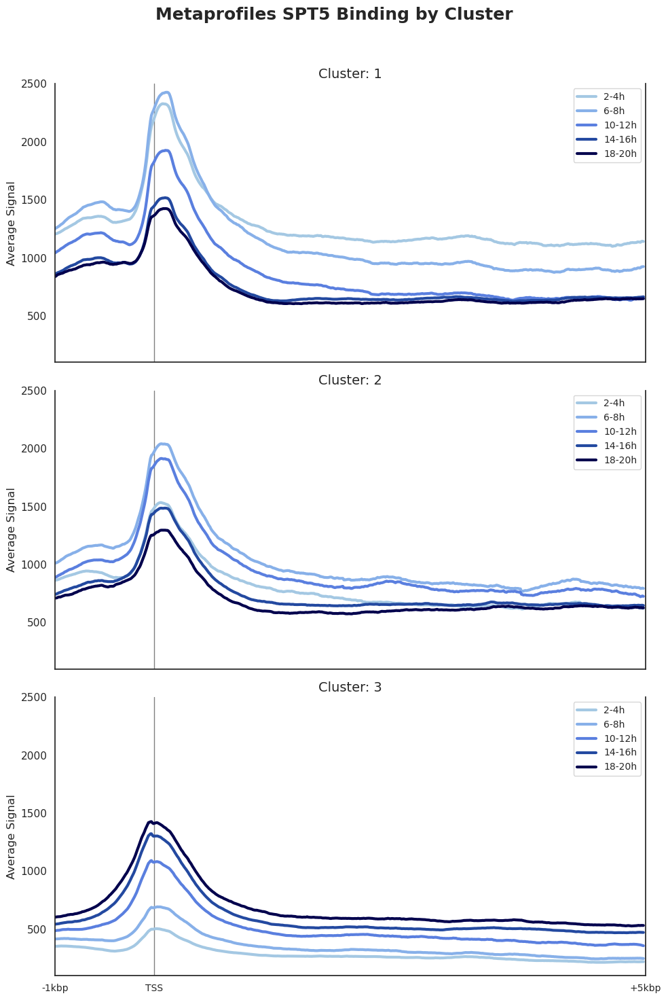

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import gzip
import json
import re

def load_matrix_data(matrix_path):
    """Load matrix data and header information from the gzipped file."""
    with gzip.open(matrix_path, 'rt') as f:
        header = f.readline()  # First line is the header

    header_data = json.loads(header.strip('@'))  # Remove '@' and parse JSON

    # Extract sample labels and boundaries
    sample_labels = header_data["sample_labels"]
    sample_boundaries = header_data["sample_boundaries"]
    group_boundaries = header_data["group_boundaries"]

    # Load the actual matrix data
    matrix_df = pd.read_csv(matrix_path, sep='\t', compression='gzip', skiprows=1, header=None)

    return matrix_df, sample_labels, sample_boundaries, group_boundaries

def split_samples(matrix_df, sample_labels, sample_boundaries):
    """Split the matrix into separate dataframes for different timepoints."""
    # Initialize empty DataFrames for each timepoint range
    df_2_4h, df_6_8h, df_10_12h, df_14_16h, df_18_20h = pd.DataFrame(), pd.DataFrame(), pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    # Iterate through sample labels to split matrix based on timepoints
    for i, sample in enumerate(sample_labels):
        start_idx = sample_boundaries[i]
        end_idx = sample_boundaries[i + 1] if i + 1 < len(sample_boundaries) else None

        if "2-4h" in sample:
            df_2_4h = matrix_df.iloc[:, start_idx+6:end_idx+6]
        elif "6-8h" in sample:
            df_6_8h = matrix_df.iloc[:, start_idx+6:end_idx+6]
        elif "10-12h" in sample:
            df_10_12h = matrix_df.iloc[:, start_idx+6:end_idx+6]
        elif "14-16h" in sample:
            df_14_16h = matrix_df.iloc[:, start_idx+6:end_idx+6]
        elif "18-20h" in sample:
            df_18_20h = matrix_df.iloc[:, start_idx+6:end_idx+6]

    return [df_2_4h, df_6_8h, df_10_12h, df_14_16h, df_18_20h]


def bin_to_basepair(timepoint, bin_index):
    # Get matrix intervals from timepoints
    start_bin, end_bin = time_intervals[timepoint]
       
    # Get bp position for plotting
    bin_position = bin_index - start_bin
    basepair_position = (bin_position - 100) * 10
    return basepair_position


def convert_bins_to_basepairs(peaks_df):
    """Convert bin indices to basepair positions based on TSS ranges for each timepoint."""
    
    # Define intervals for parsing matrix per timepoint
    time_intervals = {
        "2-4h": (0, 600),        # Bins 0-600, 
        "6-8h": (600, 1200),     # Bins 600-1200, 
        "10-12h": (1200, 1800),  # Bins 1200-1800, 
        "14-16h": (1800, 2400),  # Bins 1800-2400, 
        "18-20h": (2400, 3000)   # Bins 2400-3000
    }
    

    # Iterate over timepoint and cluster to seperate matrix
    for timepoint in peaks_df.index: 
        for cluster in peaks_df.columns:  
            peaks_df.at[timepoint, cluster] = bin_to_basepair(timepoint, peaks_df.at[timepoint, cluster])
    
    return peaks_df


def extract_timepoint(filename):
    """Extrahiert den Zeitpunktsbereich aus einem Dateinamen."""
    match = re.search(r'(\d+-\d+h)', filename)
    if match:
        return match.group(1)  # Gibt den gefundenen Zeitpunktsbereich zurück
    else:
        return None  # Falls kein Zeitpunktsbereich gefunden wurde

    
def split_timepoints(matrix_df, group_boundaries):
    """Split the matrix based on group boundaries and calculate averages."""
    # Extract rows corresponding to different groups and compute averages
    increasing = matrix_df.iloc[group_boundaries[0]:group_boundaries[1], :]
    constant = matrix_df.iloc[group_boundaries[1]:group_boundaries[2], :]
    decreasing = matrix_df.iloc[group_boundaries[2]:group_boundaries[3], :]

    increasing_avg = increasing.apply(pd.to_numeric, errors='coerce').iloc[:, 6:].mean(axis=0)
    constant_avg = constant.apply(pd.to_numeric, errors='coerce').iloc[:, 6:].mean(axis=0)
    decreasing_avg = decreasing.apply(pd.to_numeric, errors='coerce').iloc[:, 6:].mean(axis=0)

    return increasing_avg, constant_avg, decreasing_avg

def plot_cluster_data(ax, cluster, timepoints_list, colors_list):
    """Plot data for a single cluster over timepoints."""
    ax.axvline(x=100, color='grey', linestyle='-', linewidth=1)
    
    for idx, (timepoint, color) in enumerate(zip(cluster, colors_list)):
        ax.plot(range(len(timepoint)), timepoint, label=f'{timepoints_list[idx]}', color=color, linewidth=3)
    
    ax.set_ylabel('Average Signal', fontsize=12)
    ax.legend(fontsize=10)
    ax.set_ylim([100, 2500])  # Adjust y-axis limits as needed
    ax.set_xlim(0, 595)
    ax.set_facecolor('white')
    ax.spines['top'].set_visible(False)
    
    #ax.axvline(x=596, color='grey', linestyle='--', linewidth=1) # for TSS-TES plotting
    ax.set_xticks([0, 100, 595])
    ax.set_xticklabels(['-1kbp', 'TSS', '+5kbp'], fontsize=10)
    ax.tick_params(axis='x', length=5)
    ax.tick_params(axis='y', length=5)

def main(matrix_path, output_path):
    """Main function to load data, process it, and plot metaprofiles for each cluster."""
    # Load data from the gzipped matrix
    matrix_df, sample_labels, sample_boundaries, group_boundaries = load_matrix_data(matrix_path)
    df_timepoints = split_samples(matrix_df, sample_labels, sample_boundaries)

    # Initialize arrays for storing the averaged cluster data
    clusters_timepoint_wise = [[], [], []]

    # Loop through timepoints and split the matrix for each cluster
    for timepoint_df in df_timepoints:
        cluster_1, cluster_2, cluster_3 = split_timepoints(timepoint_df, group_boundaries)
        clusters_timepoint_wise[0].append(cluster_1)
        clusters_timepoint_wise[1].append(cluster_2)
        clusters_timepoint_wise[2].append(cluster_3)
        

    timepoints_list = ["2-4h", "6-8h", "10-12h", "14-16h", "18-20h"]
    colors_list = ["#a4c8e3", "#87b0e9", "#5a7fdf", "#2349a0", "#00004d"]

    # Create a figure with 3 subplots, one for each cluster
    fig, axes = plt.subplots(3, 1, figsize=(10, 15), sharex=True)

    
    # Plot each cluster's data across all timepoints
    for idx, ax in enumerate(axes):
        plot_cluster_data(ax, clusters_timepoint_wise[idx], timepoints_list, colors_list)
        ax.set_title(f'Cluster: {idx+1}', fontsize=14)

    # Adjust layout and save the figure
    fig.suptitle('Metaprofiles SPT5 Binding by Cluster', fontsize=18, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(output_path)
    plt.show()
    plt.close()

 

# Example paths for loading and saving
matrix_path = "/g/furlong/project/92_SPT4_SPT5/Manuscript/Figures/Figure_1/Figure_1_D_clusters_genes_TES_NaN.gz"
output_path = plot_dir + "Figure_1_D_Cluster_Metaprofiles_TSS.pdf"
main(matrix_path, output_path)


### Figure 1E: PyGenomeTracks: SPT5 binding and RNAseq for example gene of each cluster <a class="anchor" id="4_pygenometracks"></a>
 ```bash
pyGenomeTracks --tracks tracks.ini --region chr2L:4985000-5060000 \
    --outFileName Figure_1_E_pygenometracks.pdf --dpi 300 --width 20
```